# The Team

**Team Name**

[146] hey girl lets ML n chill

**Member, StudNr**

Sinan Maric, 529195

Joakim Ness, 544839

Ole Lasson, 543928

# Imports

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import h2o
from h2o.automl import H2OAutoML
from sklearn.model_selection import train_test_split
from sklego.preprocessing import RepeatingBasisFunction
from autogluon.tabular import TabularPredictor
from sklearn.preprocessing import MinMaxScaler
from catboost import CatBoostRegressor
from catboost import Pool
from datetime import datetime


In [24]:
train_a = pd.read_parquet('A/train_targets.parquet')
train_b = pd.read_parquet('B/train_targets.parquet')
train_c = pd.read_parquet('C/train_targets.parquet')

X_train_estimated_a = pd.read_parquet('A/X_train_estimated.parquet')
X_train_estimated_b = pd.read_parquet('B/X_train_estimated.parquet')
X_train_estimated_c = pd.read_parquet('C/X_train_estimated.parquet')

X_train_observed_a = pd.read_parquet('A/X_train_observed.parquet')
X_train_observed_b = pd.read_parquet('B/X_train_observed.parquet')
X_train_observed_c = pd.read_parquet('C/X_train_observed.parquet')

X_test_estimated_a = pd.read_parquet('A/X_test_estimated.parquet')
X_test_estimated_b = pd.read_parquet('B/X_test_estimated.parquet')
X_test_estimated_c = pd.read_parquet('C/X_test_estimated.parquet')

,pv_measurement
time,
2019-06-02 22:00:00,0.00
2019-06-02 23:00:00,0.00
2019-06-03 00:00:00,0.00
2019-06-03 01:00:00,0.00
2019-06-03 02:00:00,19.36
...,...
2020-04-25 01:00:00,0.00
2020-04-25 02:00:00,0.00
2020-04-25 03:00:00,2.86


# EDA

## Domain knowledge


The group carried out research to obtain domain knowledge. The group used the weather parameter description provided in the Kaggle tournament (https://www.meteomatics.com/en/api/available-parameters/alphabetic-list/).

It was important to understand the dataset during feature engineering, understanding which features were most important and during pre/post-processing.

## Checking data quality

Checking how many NaN/Null values there are for each feature across the observed and estimated data for each location.

In [25]:
X_train_observed_a.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118669 entries, 0 to 118668
Data columns (total 46 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   date_forecast                   118669 non-null  datetime64[ns]
 1   absolute_humidity_2m:gm3        118669 non-null  float32       
 2   air_density_2m:kgm3             118669 non-null  float32       
 3   ceiling_height_agl:m            96422 non-null   float32       
 4   clear_sky_energy_1h:J           118669 non-null  float32       
 5   clear_sky_rad:W                 118669 non-null  float32       
 6   cloud_base_agl:m                110603 non-null  float32       
 7   dew_or_rime:idx                 118669 non-null  float32       
 8   dew_point_2m:K                  118669 non-null  float32       
 9   diffuse_rad:W                   118669 non-null  float32       
 10  diffuse_rad_1h:J                118669 non-null  float32

In [26]:
X_train_estimated_a.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17576 entries, 0 to 17575
Data columns (total 47 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date_calc                       17576 non-null  datetime64[ns]
 1   date_forecast                   17576 non-null  datetime64[ns]
 2   absolute_humidity_2m:gm3        17576 non-null  float32       
 3   air_density_2m:kgm3             17576 non-null  float32       
 4   ceiling_height_agl:m            13657 non-null  float32       
 5   clear_sky_energy_1h:J           17576 non-null  float32       
 6   clear_sky_rad:W                 17576 non-null  float32       
 7   cloud_base_agl:m                15482 non-null  float32       
 8   dew_or_rime:idx                 17576 non-null  float32       
 9   dew_point_2m:K                  17576 non-null  float32       
 10  diffuse_rad:W                   17576 non-null  float32       
 11  di

In [27]:
X_train_observed_b.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116929 entries, 0 to 116928
Data columns (total 46 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   date_forecast                   116929 non-null  datetime64[ns]
 1   absolute_humidity_2m:gm3        116929 non-null  float32       
 2   air_density_2m:kgm3             116929 non-null  float32       
 3   ceiling_height_agl:m            98157 non-null   float32       
 4   clear_sky_energy_1h:J           116929 non-null  float32       
 5   clear_sky_rad:W                 116929 non-null  float32       
 6   cloud_base_agl:m                109456 non-null  float32       
 7   dew_or_rime:idx                 116929 non-null  float32       
 8   dew_point_2m:K                  116929 non-null  float32       
 9   diffuse_rad:W                   116929 non-null  float32       
 10  diffuse_rad_1h:J                116929 non-null  float32

In [28]:
X_train_estimated_b.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17576 entries, 0 to 17575
Data columns (total 47 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date_calc                       17576 non-null  datetime64[ns]
 1   date_forecast                   17576 non-null  datetime64[ns]
 2   absolute_humidity_2m:gm3        17576 non-null  float32       
 3   air_density_2m:kgm3             17576 non-null  float32       
 4   ceiling_height_agl:m            13887 non-null  float32       
 5   clear_sky_energy_1h:J           17576 non-null  float32       
 6   clear_sky_rad:W                 17576 non-null  float32       
 7   cloud_base_agl:m                15613 non-null  float32       
 8   dew_or_rime:idx                 17576 non-null  float32       
 9   dew_point_2m:K                  17576 non-null  float32       
 10  diffuse_rad:W                   17576 non-null  float32       
 11  di

In [29]:
X_train_observed_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116825 entries, 0 to 116824
Data columns (total 46 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   date_forecast                   116825 non-null  datetime64[ns]
 1   absolute_humidity_2m:gm3        116825 non-null  float32       
 2   air_density_2m:kgm3             116825 non-null  float32       
 3   ceiling_height_agl:m            96902 non-null   float32       
 4   clear_sky_energy_1h:J           116825 non-null  float32       
 5   clear_sky_rad:W                 116825 non-null  float32       
 6   cloud_base_agl:m                108313 non-null  float32       
 7   dew_or_rime:idx                 116825 non-null  float32       
 8   dew_point_2m:K                  116825 non-null  float32       
 9   diffuse_rad:W                   116825 non-null  float32       
 10  diffuse_rad_1h:J                116825 non-null  float32

In [30]:
X_train_estimated_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17576 entries, 0 to 17575
Data columns (total 47 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   date_calc                       17576 non-null  datetime64[ns]
 1   date_forecast                   17576 non-null  datetime64[ns]
 2   absolute_humidity_2m:gm3        17576 non-null  float32       
 3   air_density_2m:kgm3             17576 non-null  float32       
 4   ceiling_height_agl:m            12980 non-null  float32       
 5   clear_sky_energy_1h:J           17576 non-null  float32       
 6   clear_sky_rad:W                 17576 non-null  float32       
 7   cloud_base_agl:m                14772 non-null  float32       
 8   dew_or_rime:idx                 17576 non-null  float32       
 9   dew_point_2m:K                  17576 non-null  float32       
 10  diffuse_rad:W                   17576 non-null  float32       
 11  di

## Checking if data is intuitive

To get a good overview of the data we created plots for each feature. By doing this, the group identified several anomalies and inconsistencies among the features.

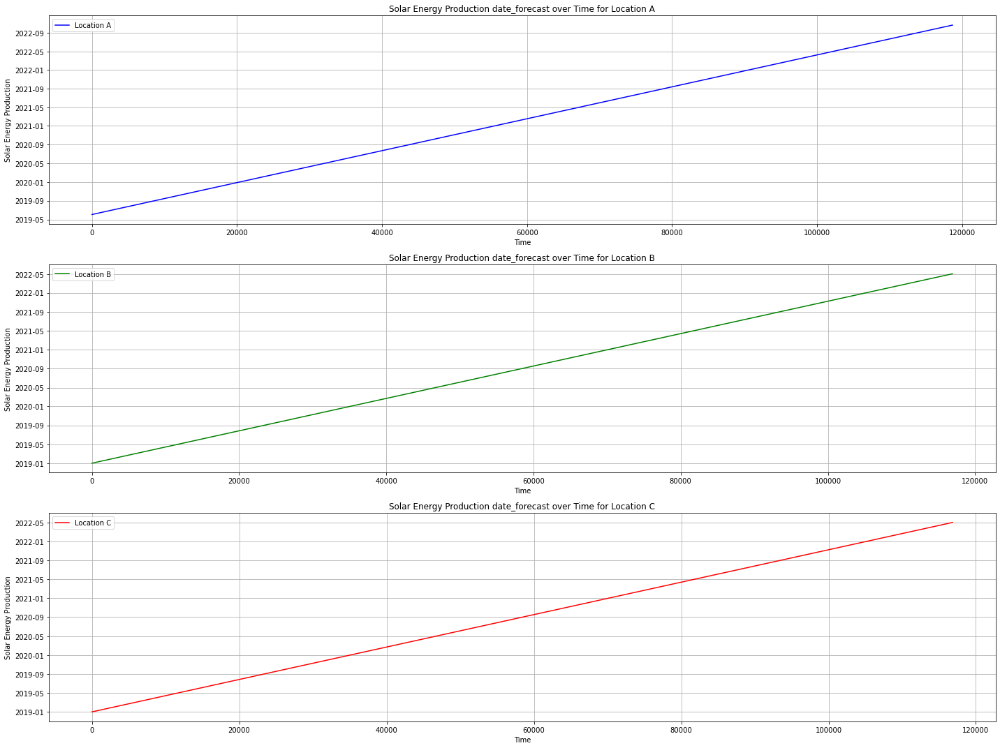

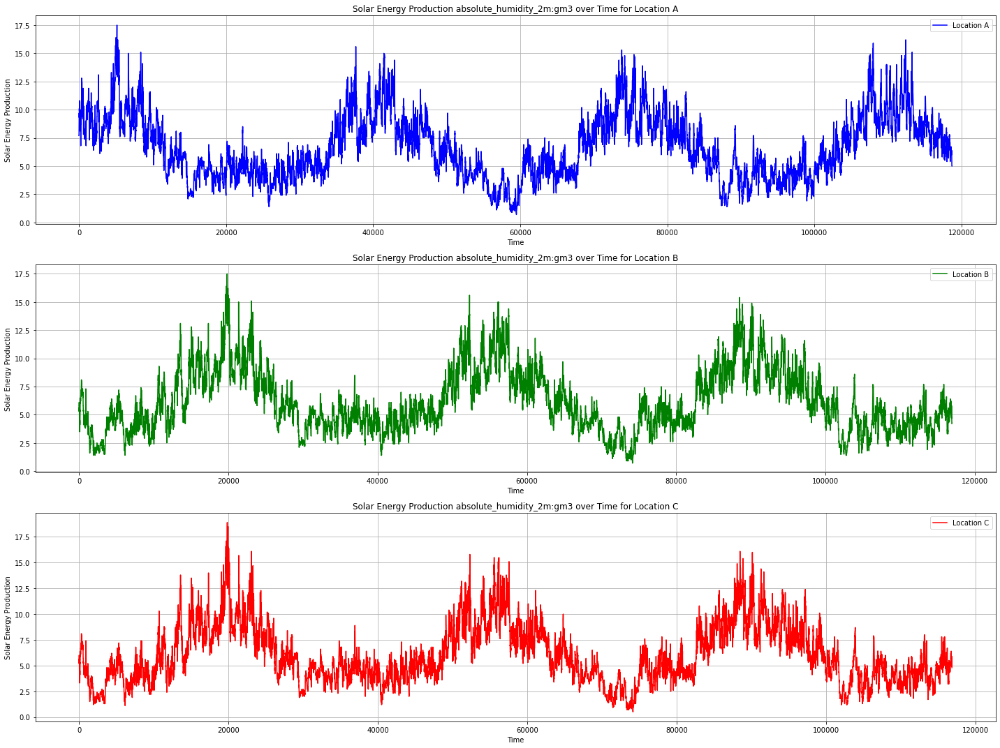

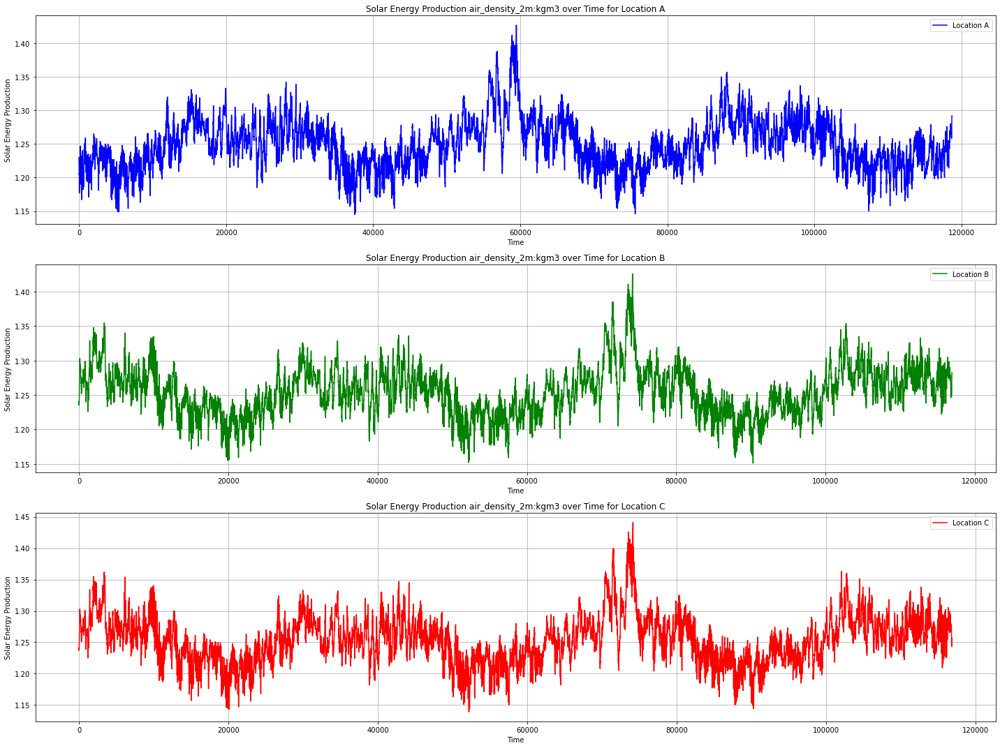

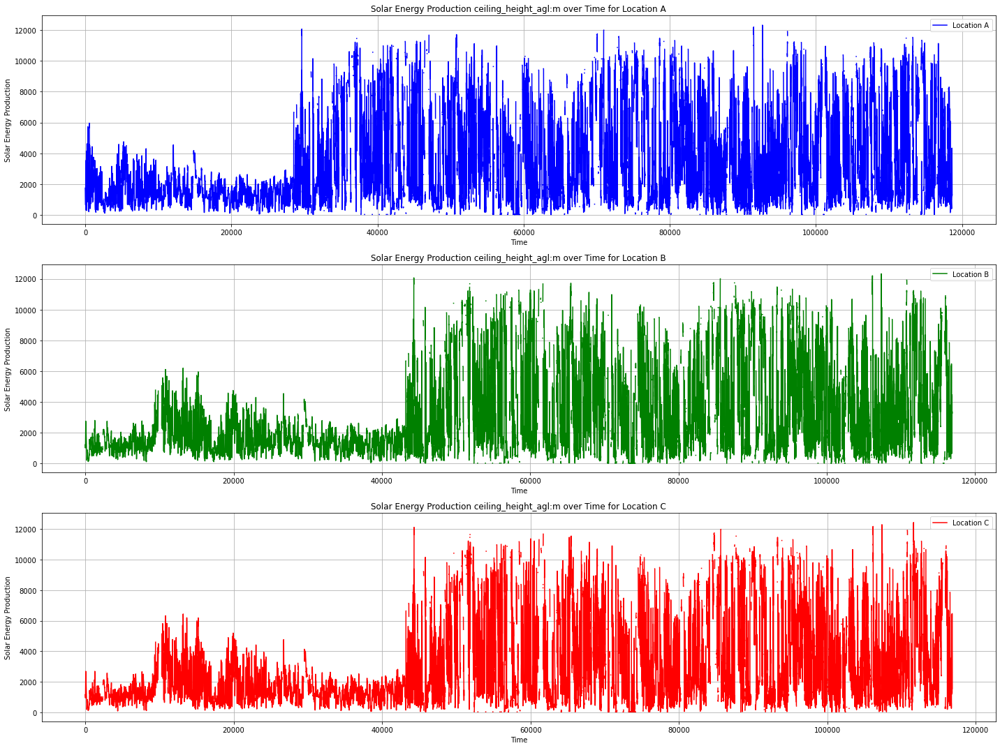

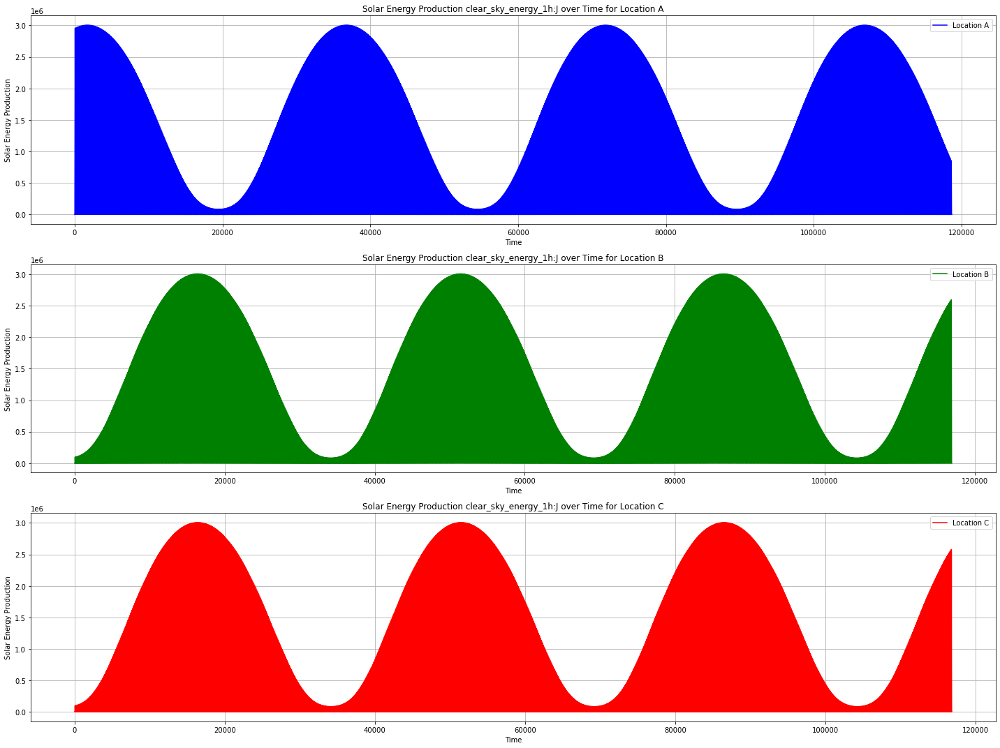

...

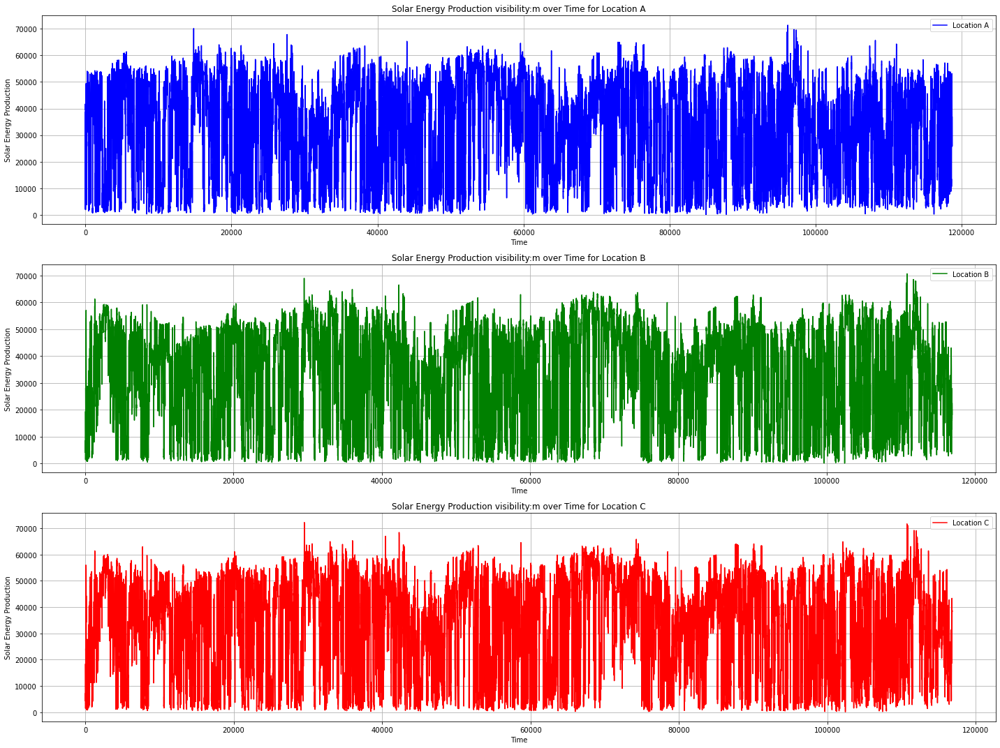

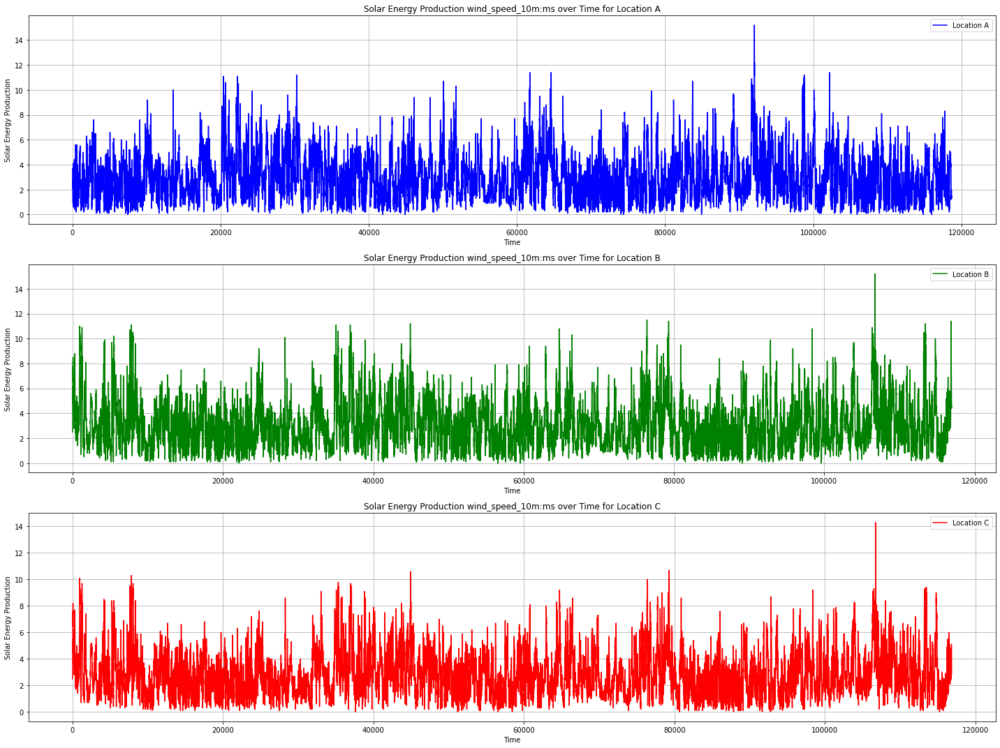

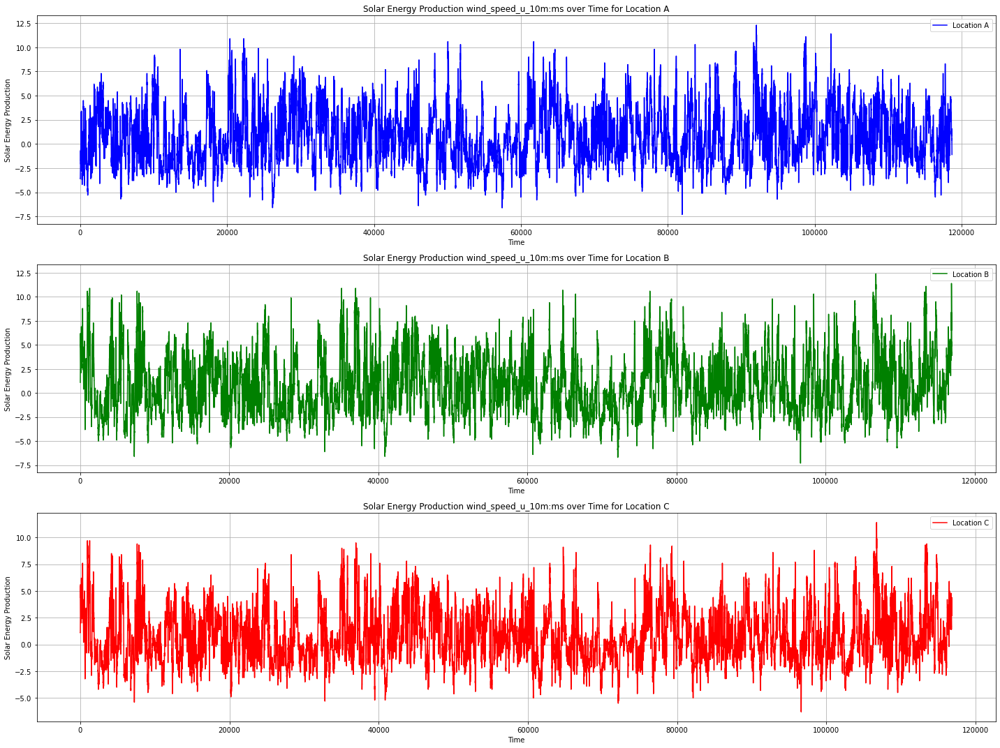

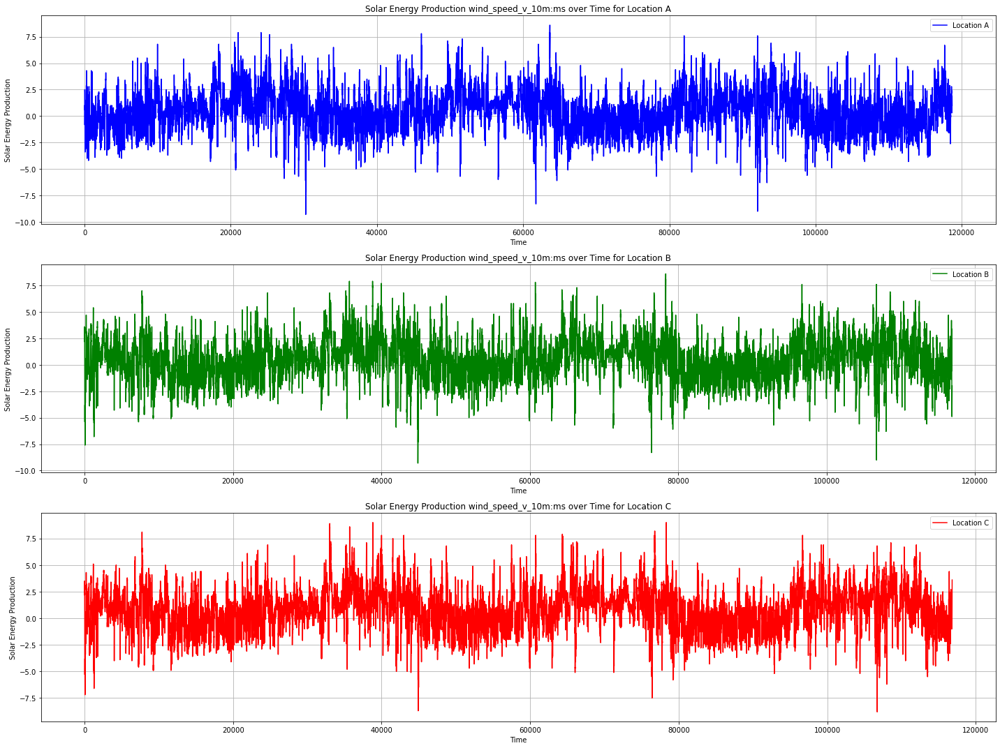

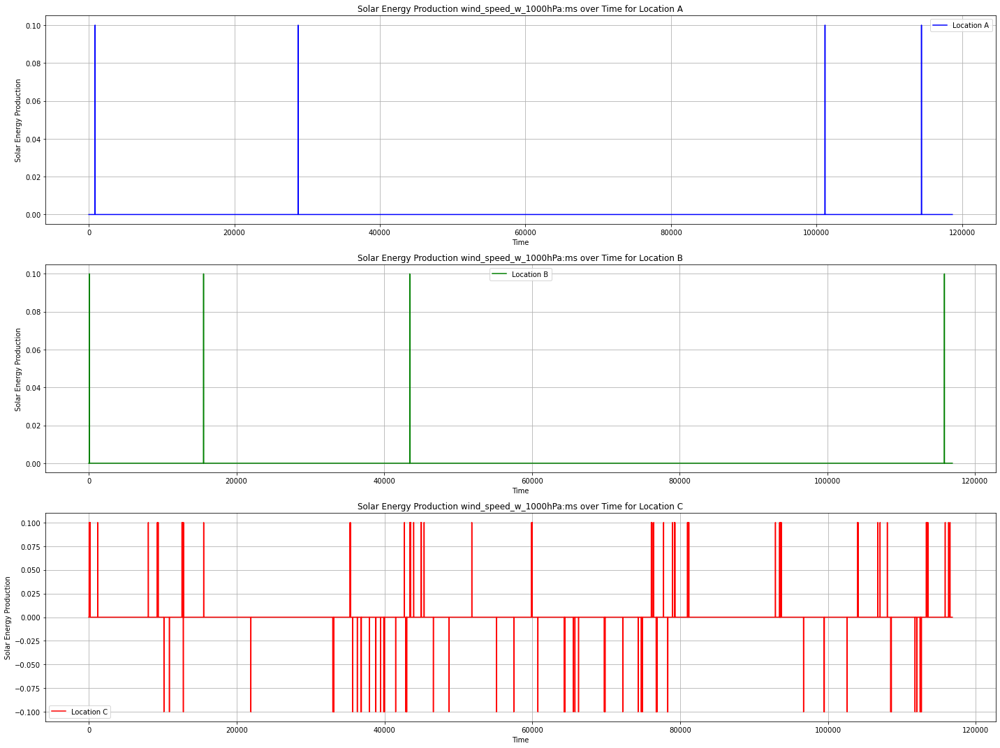

In [31]:
#exploratory data analysis and vizualization 
columns = X_train_observed_a.columns.to_list()

for el in columns: 
    # Plotting the pv_measurement over time for locations A, B, and C
    plt.figure(figsize=(20, 15))

    # Location A
    plt.subplot(3, 1, 1)
    plt.plot(X_train_observed_a[el], label='Location A', color='blue')
    plt.title(f'Solar Energy Production {el} over Time for Location A')
    plt.xlabel('Time')
    plt.ylabel('Solar Energy Production')
    plt.legend()
    plt.grid(True)

    # Location B
    plt.subplot(3, 1, 2)
    plt.plot(X_train_observed_b[el], label='Location B', color='green')
    plt.title(f'Solar Energy Production {el} over Time for Location B')
    plt.xlabel('Time')
    plt.ylabel('Solar Energy Production')
    plt.legend()
    plt.grid(True)

    # Location C
    plt.subplot(3, 1, 3)
    plt.plot(X_train_observed_c[el], label='Location C', color='red')
    plt.title(f'Solar Energy Production {el} over Time for Location C')
    plt.xlabel('Time')
    plt.ylabel('Solar Energy Production')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


# Plotting the pv_measurement over time for locations A, B, and C
print('Checkpoint 2')
plt.figure(figsize=(20, 15))

# Location A
plt.subplot(3, 1, 1)
plt.plot(data_a[el], label='Location A', color='blue')
plt.title(f'Solar Energy Production {el} over Time for Location A')
plt.xlabel('Time')
plt.ylabel('Solar Energy Production')
plt.legend()
plt.grid(True)

print('Checkpoint 3')

# Location B
plt.subplot(3, 1, 2)
plt.plot(data_b[el], label='Location B', color='green')
plt.title(f'Solar Energy Production {el} over Time for Location B')
plt.xlabel('Time')
plt.ylabel('Solar Energy Production')
plt.legend()
plt.grid(True)

# Location C
plt.subplot(3, 1, 3)
plt.plot(data_c[el], label='Location C', color='red')
plt.title(f'Solar Energy Production {el} over Time for Location C')
plt.xlabel('Time')
plt.ylabel('Solar Energy Production')
plt.legend()
plt.grid(True)



plt.tight_layout()

plt.show()




### Constant values in PV-measurement and gaps

Observed recurring gaps for both zero and non-zero values, indicating faulty measurements. These were dealt with during pre-processing by dropping these rows.

### Different time stamps: Every 15 minutes and hourly

We observed that the datasets containing all the features (X_data) were aggregated to every 15 minutes, while the target values (PV-measurement) were aggregated every 1 hour. We dealt with this during pre-processing by aggregating from every 15 minutes to 1 hour by taking the mean values.

In [32]:
X_train_observed_a['date_forecast'].head(3)

0   2019-06-02 22:00:00
1   2019-06-02 22:15:00
2   2019-06-02 22:30:00
Name: date_forecast, dtype: datetime64[ns]

In [33]:
train_a['time'].head(3)

0   2019-06-02 22:00:00
1   2019-06-02 23:00:00
2   2019-06-03 00:00:00
Name: time, dtype: datetime64[ns]

### NaN values in snow_density

Identified many NaN values in snow_density, so the group dropped the whole column.

### Observed/Estimated

The group looked at the transition between observed and estimated data. Realizing a large time gap between the two. The group decided not to adress this gap, other than flagging estimated and observed data. Which turned into an important cat_feature. 

## Understand how the data was generated

### Measurement errors observed

As previously mentioned, the group had to make assumptions about data inconsistencies. For example that large time gaps was because of faulty measurements, leading to the group dropping this data as it was noisy.

### Estimated inconsistencies

The group had a realistic approach to the estimated data. The fact that they are predictions from a meteorologist means that they are not accurate, and is a source of error. Differing from observed data that is historical data. It is also important to realize that observed data may not repeat itself in the future. That is why we avoided interpolation based on previous data.

## Explore individual features

As previously elaborated upon, the group explored individual features. Feature importance plots were also important to understand which features our models viewed as most important. This will be further discussed in the *Feature Importance* section.

This information was further used to choose features to drop i.e. snow_density, and features we could further feature engineer, which will be discussed further in the *Pre-processing* section.

## Explore pairs and groups of features

### Correlation matrices

The group created a correlation matrix for each location to aid in feature selection. Features with high correlation may be linearly dependent, meaning they often impact the dependent variable in a similar manner. Therefore, if two features have high correlation, it could be wise to remove one of them to reduce noise. However, the group decided not to drop such features, because we got good results with them included.

In [34]:
X_train_observed_a.corr()

/var/folders/ln/psx1xlb54d58wpx85ns5z98h0000gn/T/ipykernel_57014/3177286522.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  X_train_observed_a.corr()


,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
absolute_humidity_2m:gm3,1.000000,-0.804124,0.085147,0.352801,0.349927,0.023171,0.123430,0.974863,0.284847,0.291109,...,0.022875,0.432344,0.110364,0.900297,0.043038,-0.158686,-0.157917,0.050106,-0.258794,0.004869
air_density_2m:kgm3,-0.804124,1.000000,-0.156346,-0.473967,-0.463355,-0.119360,-0.060455,-0.838733,-0.402079,-0.415496,...,-0.067960,-0.504503,-0.063599,-0.915070,-0.103049,-0.011076,-0.017527,0.026196,0.142869,-0.000575
ceiling_height_agl:m,0.085147,-0.156346,1.000000,0.087503,0.079602,0.717460,0.043446,0.074464,0.090662,0.095620,...,0.060923,0.080978,-0.338231,0.242046,-0.035658,0.437736,-0.166661,-0.317046,0.000529,-0.002214
clear_sky_energy_1h:J,0.352801,-0.473967,0.087503,1.000000,0.992332,0.053663,-0.080023,0.362016,0.911178,0.922412,...,0.056788,0.847872,0.016904,0.438994,0.009891,0.092573,0.013025,0.069513,-0.343041,-0.005087
clear_sky_rad:W,0.349927,-0.463355,0.079602,0.992332,1.000000,0.049702,-0.079422,0.359138,0.917222,0.914733,...,0.002422,0.851637,0.017788,0.424912,0.009648,0.083516,0.003153,0.063870,-0.327927,-0.006878
cloud_base_agl:m,0.023171,-0.119360,0.717460,0.053663,0.049702,1.000000,0.038354,0.014285,0.031954,0.036197,...,0.047758,0.038307,-0.273681,0.202385,-0.107341,0.464467,-0.196807,-0.395654,0.053609,-0.000473
dew_or_rime:idx,0.123430,-0.060455,0.043446,-0.080023,-0.079422,0.038354,1.000000,0.123717,-0.080196,-0.081953,...,-0.039829,-0.072291,-0.036164,0.109030,-0.033482,-0.031053,-0.108146,-0.038802,0.005134,-0.001638
dew_point_2m:K,0.974863,-0.838733,0.074464,0.362016,0.359138,0.014285,0.123717,1.000000,0.296786,0.303062,...,0.022321,0.442296,0.142080,0.916851,0.077516,-0.187977,-0.113872,0.091420,-0.247719,0.006699
diffuse_rad:W,0.284847,-0.402079,0.090662,0.911178,0.917222,0.031954,-0.080196,0.296786,1.000000,0.986987,...,0.004610,0.811529,-0.061333,0.354185,0.094271,0.109883,-0.004529,0.059466,-0.298845,-0.004807
diffuse_rad_1h:J,0.291109,-0.415496,0.095620,0.922412,0.914733,0.036197,-0.081953,0.303062,0.986987,1.000000,...,0.059713,0.813164,-0.056994,0.370067,0.089025,0.117639,0.003206,0.064133,-0.315196,-0.002726


In [35]:
X_train_observed_b.corr()

/var/folders/ln/psx1xlb54d58wpx85ns5z98h0000gn/T/ipykernel_57014/1025032477.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  X_train_observed_b.corr()


,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
absolute_humidity_2m:gm3,1.000000,-0.803140,0.089730,0.351970,0.349803,0.032345,0.106170,0.973617,0.275009,0.280392,...,0.019578,0.414177,0.125561,0.898858,0.037897,-0.209541,-0.123073,0.074659,-0.224222,0.000319
air_density_2m:kgm3,-0.803140,1.000000,-0.163125,-0.426312,-0.415014,-0.136315,-0.058997,-0.835982,-0.352774,-0.366327,...,-0.069056,-0.438455,-0.079265,-0.905998,-0.111496,0.055039,-0.052708,0.004486,0.107456,0.003144
ceiling_height_agl:m,0.089730,-0.163125,1.000000,0.121044,0.113585,0.721705,0.035510,0.083174,0.116278,0.121523,...,0.057527,0.104401,-0.307199,0.244901,-0.029600,0.407243,-0.140064,-0.275997,0.003045,-0.001176
clear_sky_energy_1h:J,0.351970,-0.426312,0.121044,1.000000,0.992327,0.113611,-0.046469,0.355204,0.910521,0.921584,...,0.054246,0.835121,0.006706,0.439939,-0.011978,0.034466,0.004644,0.055927,-0.326285,-0.006746
clear_sky_rad:W,0.349803,-0.415014,0.113585,0.992327,1.000000,0.108537,-0.045907,0.352803,0.916800,0.914074,...,0.002679,0.838693,0.007119,0.426018,-0.011771,0.025276,-0.005736,0.050799,-0.312832,-0.008338
cloud_base_agl:m,0.032345,-0.136315,0.721705,0.113611,0.108537,1.000000,0.034964,0.025223,0.088955,0.094775,...,0.049780,0.088615,-0.267407,0.218876,-0.123091,0.452409,-0.167332,-0.359368,0.035222,0.002336
dew_or_rime:idx,0.106170,-0.058997,0.035510,-0.046469,-0.045907,0.034964,1.000000,0.100991,-0.046467,-0.047867,...,-0.032680,-0.028765,-0.019340,0.087286,-0.022858,-0.031031,-0.078721,-0.022483,-0.004739,-0.001196
dew_point_2m:K,0.973617,-0.835982,0.083174,0.355204,0.352803,0.025223,0.100991,1.000000,0.282841,0.288429,...,0.020967,0.417775,0.162847,0.913695,0.079165,-0.249624,-0.074258,0.123904,-0.210172,0.001741
diffuse_rad:W,0.275009,-0.352774,0.116278,0.910521,0.916800,0.088955,-0.046467,0.282841,1.000000,0.987362,...,0.004313,0.804448,-0.062744,0.347190,0.073630,0.055089,-0.008523,0.046948,-0.286446,-0.006638
diffuse_rad_1h:J,0.280392,-0.366327,0.121523,0.921584,0.914074,0.094775,-0.047867,0.288429,0.987362,1.000000,...,0.057125,0.806001,-0.059043,0.362747,0.068473,0.062547,0.000037,0.051044,-0.301472,-0.004836


In [36]:
X_train_observed_c.corr()

/var/folders/ln/psx1xlb54d58wpx85ns5z98h0000gn/T/ipykernel_57014/633645388.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  X_train_observed_c.corr()


,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
absolute_humidity_2m:gm3,1.000000,-0.798575,0.073739,0.362443,0.359792,0.019743,0.288599,0.969293,0.279766,0.285652,...,0.025393,0.424681,0.135371,0.888397,0.064343,-0.219873,-0.147144,0.062818,-0.270601,0.000203
air_density_2m:kgm3,-0.798575,1.000000,-0.164285,-0.481943,-0.471485,-0.136326,-0.262647,-0.839707,-0.404633,-0.417968,...,-0.067965,-0.494807,-0.073026,-0.906939,-0.132499,0.039309,-0.072934,0.016441,0.138337,0.059198
ceiling_height_agl:m,0.073739,-0.164285,1.000000,0.123533,0.116242,0.722553,-0.002733,0.066970,0.120815,0.125635,...,0.054766,0.103801,-0.312072,0.246221,-0.021671,0.404215,-0.105135,-0.280314,0.045638,-0.032937
clear_sky_energy_1h:J,0.362443,-0.481943,0.123533,1.000000,0.992318,0.111812,0.024397,0.367311,0.908930,0.919913,...,0.054209,0.835084,0.014875,0.442552,0.004474,0.060362,0.005627,0.052330,-0.382739,0.036150
clear_sky_rad:W,0.359792,-0.471485,0.116242,0.992318,1.000000,0.107704,0.024685,0.364515,0.915082,0.912235,...,0.002635,0.838659,0.015188,0.429262,0.004261,0.052746,-0.005278,0.048158,-0.367115,0.033487
cloud_base_agl:m,0.019743,-0.136326,0.722553,0.111812,0.107704,1.000000,-0.025198,0.012325,0.093285,0.098330,...,0.044527,0.086024,-0.275659,0.221246,-0.117940,0.450554,-0.129665,-0.357505,0.088262,-0.049101
dew_or_rime:idx,0.288599,-0.262647,-0.002733,0.024397,0.024685,-0.025198,1.000000,0.318780,0.025604,0.025588,...,-0.021453,0.091361,0.082175,0.261600,0.117423,-0.136048,0.004154,0.045871,-0.033391,0.001065
dew_point_2m:K,0.969293,-0.839707,0.066970,0.367311,0.364515,0.012325,0.318780,1.000000,0.290059,0.296135,...,0.025999,0.429971,0.172242,0.904281,0.112449,-0.257280,-0.088511,0.111341,-0.256053,0.003171
diffuse_rad:W,0.279766,-0.404633,0.120815,0.908930,0.915082,0.093285,0.025604,0.290059,1.000000,0.987255,...,0.004665,0.802866,-0.060028,0.347259,0.082791,0.087422,-0.008779,0.041768,-0.335928,0.038219
diffuse_rad_1h:J,0.285652,-0.417968,0.125635,0.919913,0.912235,0.098330,0.025588,0.296135,0.987255,1.000000,...,0.057406,0.804389,-0.056326,0.362448,0.078400,0.093558,-0.000366,0.044974,-0.353234,0.040925


### Wind features

We realized that the dataset contained several wind features. Including different wind vectors and one absolute value. The first though was to only include the absolute value, and drop the vectors. But we did not gain any better results by doing this. So, we decided not to go further with this.

## Clean up features

### NaN values

Removing columns where there are a substantial amount of NaN values and constant values as previously elaborated upon.

# Pre-processing

## Pre-processing X

**Data aggregation**: Initially, it groups data by hour (`'1H'`) and calculates the mean for each group. This step is important to solve the problem regarding different data aggregation identified during the EDA.

**Handling missing values**: Removes rows where all elements are NaN, to remove time gaps.

**Feature engineering**: Extracts time-related features from the index, such as `hour`, `week`, and a combined `week_hour` feature (used for avg_measurement, which will be discussed later). Also adds `month` as a feature. This is later used for encoding.

**Cyclical feature encoding**: Transforms `hour` and `month` into sinus and cosinus components to capture the cyclical nature of these time features.

**Feature removal**: Drops several columns including `snow_density:kgm3`, `month`, `hour`, `week`, and `week_hour`. As mentioned, we investigated individual features during EDA. And dropped snow_density because of many NaN values. After the cyclical encoding, `month` and `hour` is also removed. We tried using `week_hour` and `week` during training, but worsened our results.

**Categorical encoding for elevation**: Maps elevation values to categorical labels (`A`, `B`, `C`) and then drops the original `elevation:m` column.

In [37]:
def preprocessing_X(df):
    data = df.copy()
    if 'date_calc' in data.columns:
        data.drop('date_calc', axis=1, inplace=True)

    if 'date_forecast' in data.columns:
        data.set_index('date_forecast', inplace=True)

    
    data = data.groupby(pd.Grouper(freq='1H')).mean()
    #data = data.groupby(pd.Grouper(freq='1H')).agg(custom_agg)
    
    
    data.dropna(how='all', inplace=True)
    
    data['hour'] = data.index.hour
    data['week'] = pd.to_numeric(data.index.isocalendar().week)
    data['week_hour'] = data['week'] * 100 + data['hour']
    data['month'] = data.index.month


    #TODO: prøv annen encoding her
    data['hour_sinus'] = np.sin(2*np.pi*data['hour']/ 23)
    data['hour_cosine'] = np.cos(2*np.pi*data['hour'] / 23)

    data['month_sinus'] = np.sin(2*np.pi*data['month'] / 12)
    data['month_cosine'] = np.cos(2*np.pi*data['month'] / 12)

    

    data.drop(columns=['snow_density:kgm3', 'hour', 'month', 'week','week_hour'], inplace=True)
    
    data.rename_axis('time', inplace=True)

    mapping = elevation_mapping = {
            6.0 : 'A',
            7.0 : 'B',
            24.0 : 'C'
        }
    
    data['location'] = data['elevation:m'].map(mapping)
    data['location'] = data['location'].astype(str)
    data.drop(columns=['elevation:m'], inplace=True)
    
    return data

## Custom_agg attempt

The aim with this dictionary was to adapt which aggregation method to use for each feature. The reason why we did this was because of the different nature of the features. We did not manage to implement this. So, we ended up just doing mean for each feature.

In [38]:
custom_agg = {
    'absolute_humidity_2m:gm3': 'mean',
    'air_density_2m:kgm3': 'mean',
    'ceiling_height_agl:m': 'mean',
    'clear_sky_energy_1h:J': 'sum',
    'clear_sky_rad:W': 'mean',
    'cloud_base_agl:m': 'mean',
    'dew_or_rime:idx': 'mean',
    'dew_point_2m:K': 'mean',
    'diffuse_rad:W': 'mean',
    'diffuse_rad_1h:J': 'sum',
    'direct_rad:W': 'mean',
    'direct_rad_1h:J': 'sum',
    'effective_cloud_cover:p': 'mean',
    'elevation:m': 'mean',
    'fresh_snow_12h:cm': 'sum',
    'fresh_snow_1h:cm': 'sum',
    'fresh_snow_24h:cm': 'sum',
    'fresh_snow_3h:cm': 'sum',
    'fresh_snow_6h:cm': 'sum',
    'is_day:idx': 'mean',  
    'is_in_shadow:idx': 'mean',  
    'msl_pressure:hPa': 'mean',
    'precip_5min:mm': 'sum',
    'precip_type_5min:idx': 'mean',  
    'pressure_100m:hPa': 'mean',
    'pressure_50m:hPa': 'mean',
    'prob_rime:p': 'mean',
    'rain_water:kgm2': 'sum',
    'relative_humidity_1000hPa:p': 'mean',
    'sfc_pressure:hPa': 'mean',
    'snow_density:kgm3': 'mean',
    'snow_depth:cm': 'mean',
    'snow_drift:idx': 'mean',
    'snow_melt_10min:mm': 'sum',
    'snow_water:kgm2': 'sum',
    'sun_azimuth:d': 'mean',
    'sun_elevation:d': 'mean',
    'super_cooled_liquid_water:kgm2': 'sum',
    't_1000hPa:K': 'mean',
    'total_cloud_cover:p': 'mean',
    'visibility:m': 'mean',
    'wind_speed_10m:ms': 'mean',
    'wind_speed_u_10m:ms': 'mean',
    'wind_speed_v_10m:ms': 'mean',
    'wind_speed_w_1000hPa:ms': 'mean'
}

## Pre-processing Y

**Filtering consecutive values**:
  - The first function is only used on location B and C, as the data from location A is deemed to be of high quality from our EDA.
  - A mask is created to identify sequences of 3 or more consecutive rows where `pv_measurement` is the same and non-zero. Done to remove erroneous constant data, assumed to be faulty measurements.
  - Another mask is created to identify sequences of 24 or more consecutive zero values in `pv_measurement`. Filters out these long sequences of zero values. As mentioned in the EDA section, there may be periods of inactivity or downtime that are not relevant for the analysis.

**Handling missing values**: Drops any rows with NaN values.


In [39]:
def remove_constants_Y(df):
    data = df.copy()

    # Create a mask to identify sequences of 3 or more consecutive rows with the same 'pv_measurement' (non-zero)
    consecutive_mask = (data['pv_measurement'] == data['pv_measurement'].shift(1)) & (data['pv_measurement'] != 0)
    consecutive_count = consecutive_mask.groupby((~consecutive_mask).cumsum()).cumsum()
    mask_consecutive = (consecutive_count <= 3) | (~consecutive_mask)

    #create a mask to identify sequences of 24 or more consecutive 0-valued pv-measurement
    consecutive_mask_0 = (data['pv_measurement'] == data['pv_measurement'].shift(1)) & (data['pv_measurement'] == 0)
    consecutive_count_0 = consecutive_mask_0.groupby((~consecutive_mask_0).cumsum()).cumsum()
    mask_consecutive_0 = (consecutive_count_0 <= 24) | (~consecutive_mask_0)

    combined_mask = mask_consecutive & mask_consecutive_0

    filtered_data = data[combined_mask]

    return filtered_data


def preprocessing_Y(df):
    data = df.copy()
    if 'time' in data.columns:
        data.set_index('time', inplace=True)
    data.dropna(inplace=True)
    
    return data

## Feature engineering

The following are examples of **feature selection**, and we **excluded** snow_density as previously mentioned.

**Average measurements**:
Added the hourly average measurements corrosponding to the week number of all PV-measurements. We thought this might be a good starting point for the model to predict the PV-measurement.  

    Example: For 0800 in week 42, we calculate the average of this hour for this week from all other years and add this as a new feature.

However, this did not give us great results, so we decided not to go further with it. 

**Estimated/Observed flag**:
Added a flag for estimated and observed data to let the models learn the difference.

**Radial basis function**:
An attempt to implement a radial basis function. The idea was to encode the time stamps to exploit the continuity of our time features. We did not manage to implement it, so we stuck with cosine/sine encoding.

In [40]:
def generating_avgmeas(df): 
    data = df.copy()
    for location in data['location'].unique():
        # Filter the DataFrame for the current loc_flag value
        filtered_df = data[data['location'] == location]
        
        # Group the filtered DataFrame by 'month' and calculate the mean 'pv_measurement'
        avg_measurement_by_month = filtered_df.groupby('week_hour')['pv_measurement'].mean()
        
        # Convert the result to a dictionary
        avg_measurement_dict = avg_measurement_by_month.to_dict()
        
        # Assign the result to the appropriate dictionary based on loc_flag value
        if location == 'A':
            average_measurement_a = avg_measurement_dict
        elif location == 'B':
            average_measurement_b = avg_measurement_dict
        elif location == 'C':
            average_measurement_c = avg_measurement_dict
    return average_measurement_a, average_measurement_b, average_measurement_c

def add_avgmeas(average_measurement_a, average_measurement_b, average_measurement_c, df):
    data = df.copy()
    data['average_measurement'] = data.apply(lambda row: average_measurement_a[row['week_hour']]
                                            if row['location'] == 'A'
                                            else (average_measurement_b[row['week_hour']]
                                                if row['location'] == 'B'
                                                else average_measurement_c[row['week_hour']]), axis=1)
    
    data.drop(columns=['week_hour'], inplace=True)
    return data

def add_estimated_flag(df, estimated):
    data = df.copy()

    data['estimated'] = 'E' if estimated else 'O'

    return data

def rbf_function(df,column_name,N_PERIODS):
    rbf = RepeatingBasisFunction(n_periods=N_PERIODS,
                            remainder='passthrough',
                            column=column_name,
                            input_range=(df[column_name].min() ,df[column_name].max()))
    rbf.fit(df)
    data_period = pd.DataFrame(rbf.transform(df), columns=df.columns)
    return data_period

## Handling datasets for multiple locations

- For each of the datasets (A, B, C), the following steps are executed:
  - **Data preprocessing**: Applies the `preprocessing_X` function to both observed and estimated data.
  - **Flag addition**: Adds a flag to differentiate between observed and estimated data using the `add_estimated_flag` function.
  - **Concatenating observed and estimated** 

- **Merging features and labels**: Each feature set (`x_train_a`, `x_train_b`, `x_train_c`) is merged with its respective labels, processed by `preprocessing_Y` (and `remove_constants_Y` where applicable), based on the 'time' column.
- **Concatenating datasets**: Concatenates the processed feature and label sets for all three datasets into `x_train` and `transformed_x_train`.
- **Train-validation split**: Splits both the original and transformed datasets into training and validation sets using `train_test_split`.


**Separates dataset by location**
- Separates the training and validation datasets into sub-datasets based on the 'location' feature, creating separate datasets for locations A, B, and C.


**Test data preparation**
- Prepares test data (`x_test_a`, `x_test_b`, `x_test_c`) using the `preprocessing_X` function and adds an estimated flag. 
- Concatenates these datasets into a single `x_test` dataset.


In [41]:

#combining observed and estimated data
observed_a = preprocessing_X(X_train_observed_a)
observed_a = add_estimated_flag(observed_a, False)

estimated_a = preprocessing_X(X_train_estimated_a)
estimated_a = add_estimated_flag(estimated_a, True)


x_train_a = pd.concat([observed_a, estimated_a], axis=0)
y_train_a = preprocessing_Y(train_a)
m_train_a = x_train_a.merge(y_train_a, how='inner', on='time')



observed_b = preprocessing_X(X_train_observed_b)
observed_b = add_estimated_flag(observed_b, False)

estimated_b = preprocessing_X(X_train_estimated_b)
estimated_b = add_estimated_flag(estimated_b, True)

x_train_b = pd.concat([observed_b, estimated_b], axis=0)
y_train_b = preprocessing_Y(train_b)
y_train_b = remove_constants_Y(y_train_b)
m_train_b = x_train_b.merge(y_train_b, how='inner', on='time')


observed_c = preprocessing_X(X_train_observed_c)
observed_c = add_estimated_flag(observed_c, False)

estimated_c = preprocessing_X(X_train_estimated_c)
estimated_c = add_estimated_flag(estimated_c, True)


x_train_c = pd.concat([observed_c, estimated_c], axis=0)
y_train_c = preprocessing_Y(train_c)
y_train_c = remove_constants_Y(y_train_c)
m_train_c = x_train_c.merge(y_train_c, how='inner', on='time')


x_train = pd.concat([m_train_a, m_train_b, m_train_c], axis=0, ignore_index=True)



y_train = x_train['pv_measurement']


x_train = x_train.drop(columns=['pv_measurement'], axis=1)


X_train, X_val, Y_train, Y_val = train_test_split(x_train, y_train, test_size=0.2, shuffle=True, random_state=10)


X_train_a = X_train[X_train['location'] == 'A']
X_train_b = X_train[X_train['location'] == 'B']
X_train_c = X_train[X_train['location'] == 'C']


Y_train_a = Y_train[X_train['location'] == 'A']
Y_train_b = Y_train[X_train['location'] == 'B']
Y_train_c = Y_train[X_train['location'] == 'C']


X_val_a = X_val[X_val['location'] == 'A']
X_val_b = X_val[X_val['location'] == 'B']
X_val_c = X_val[X_val['location'] == 'C']


Y_val_a = Y_val[X_val['location'] == 'A']
Y_val_b = Y_val[X_val['location'] == 'B']
Y_val_c = Y_val[X_val['location'] == 'C']


x_test_a = preprocessing_X(X_test_estimated_a)
x_test_a = add_estimated_flag(x_test_a, True)

x_test_b = preprocessing_X(X_test_estimated_b)
x_test_b = add_estimated_flag(x_test_b, True)

x_test_c = preprocessing_X(X_test_estimated_c)
x_test_c = add_estimated_flag(x_test_c, True)


x_test = pd.concat([x_test_a, x_test_b, x_test_c], axis=0, ignore_index=True)

### Scaling attempt

- **Feature scaling**: Applies MinMaxScaler to the `pv_measurement` feature in each dataset. This normalization step scales the data to a value between 0 and 1.

We normalized **pv_measurement**, however we only got marginal gains by averaging normalized and non-normalized CatBoost predictions. Other efforts such as averaging 100 different seeds for creating validation sets yielded better results.

In [42]:
transformed_train_a = train_a.copy()
transformed_train_b = train_b.copy()
transformed_train_c = train_c.copy()

scaler_a = MinMaxScaler()
scaler_b = MinMaxScaler()
scaler_c = MinMaxScaler()

transformed_train_a['pv_measurement'] = scaler_a.fit_transform(train_a[['pv_measurement']])
transformed_train_b['pv_measurement'] = scaler_b.fit_transform(train_b[['pv_measurement']])
transformed_train_c['pv_measurement'] = scaler_c.fit_transform(train_c[['pv_measurement']])

transformed_y_train_a = preprocessing_Y(transformed_train_a)
transformed_m_train_a = x_train_a.merge(transformed_y_train_a, how='inner', on='time')

transformed_y_train_b = preprocessing_Y(transformed_train_b)
transformed_y_train_b = remove_constants_Y(transformed_y_train_b)
transformed_m_train_b = x_train_b.merge(transformed_y_train_b, how='inner', on='time')


transformed_y_train_c = preprocessing_Y(transformed_train_c)
transformed_y_train_c = remove_constants_Y(transformed_y_train_c)
transformed_m_train_c = x_train_c.merge(transformed_y_train_c, how='inner', on='time')

transformed_x_train = pd.concat([transformed_m_train_a, transformed_m_train_b, transformed_m_train_c], axis=0, ignore_index=True)
transformed_y_train = transformed_x_train['pv_measurement']


transformed_x_train = transformed_x_train.drop(columns=['pv_measurement'], axis=1)
transformed_X_train, transformed_X_val, transformed_Y_train, transformed_Y_val = train_test_split(transformed_x_train, transformed_y_train, test_size=0.2, shuffle=True, random_state=10)

transformed_X_train_a = transformed_X_train[transformed_X_train['location'] == 'A']
transformed_X_train_b = transformed_X_train[transformed_X_train['location'] == 'B']
transformed_X_train_c = transformed_X_train[transformed_X_train['location'] == 'C']


transformed_Y_train_a = transformed_Y_train[transformed_X_train['location'] == 'A']
transformed_Y_train_b = transformed_Y_train[transformed_X_train['location'] == 'B']
transformed_Y_train_c = transformed_Y_train[transformed_X_train['location'] == 'C']


transformed_X_val_a = transformed_X_val[transformed_X_val['location'] == 'A']
transformed_X_val_b = transformed_X_val[transformed_X_val['location'] == 'B']
transformed_X_val_c = transformed_X_val[transformed_X_val['location'] == 'C']


transformed_Y_val_a = transformed_Y_val[transformed_X_val['location'] == 'A']
transformed_Y_val_b = transformed_Y_val[transformed_X_val['location'] == 'B']
transformed_Y_val_c = transformed_Y_val[transformed_X_val['location'] == 'C']

# CatBoost

This is one of the models we decieded to proceed with, and is used in `1_short_notebook.ipynb`

**Hyperparameters**
- Depth: After trial and error, we chose `depth = 9` as a hyperparameter.
- Iterations: We chose `iteration = 1000` because the model converged after almost 1000 iterations.
- Loss function: We chose `loss_function = MAE` because that is the evaluation metric submissions are evaluated on.

In [43]:
params = {
    'depth' : 9,
    'iterations' : 1000,
    'loss_function' : 'MAE'
}

def catboost(X_train, Y_train, X_val, Y_val):
    # Instantiate the CatBoostRegressor with the predefined parameters
    model = CatBoostRegressor(**params)

    # Creating training
    train_pool = Pool(data=X_train, label=Y_train, cat_features=['location', 'estimated'])

    # Creating validation pool with categorical features specified
    eval_pool = Pool(data=X_val, label=Y_val, cat_features=['location', 'estimated'])

    # Train the model with the training pool and validate with the evaluation pool
    model.fit(train_pool, use_best_model=True, eval_set=eval_pool)
    
    return model 

# Function to train the model and predict, handling both single and multiple datasets
def train_predict(single=False):
    if not single:
        # Train model on a single dataset
        model = catboost(X_train, Y_train, X_val, Y_val)
        
        # Predict using the trained model and create a DataFrame with predictions
        predictions = pd.DataFrame(model.predict(x_test), columns=['prediction'])

        # Set 'id' as the index name of the DataFrame
        predictions.index.name = 'id'

        # Return the predictions and the trained model
        return predictions, model
    else:
        # Process for multiple datasets A, B, C follows the same logic as above
        model_a = catboost(X_train_a, Y_train_a, X_val_a, Y_val_a)
        predict_a = model_a.predict(x_test_a)
        predictions_a = pd.DataFrame(predict_a, columns=['prediction'])

        model_b = catboost(X_train_b, Y_train_b, X_val_b, Y_val_b)
        predict_b = model_b.predict(x_test_b)
        predictions_b = pd.DataFrame(predict_b, columns=['prediction'])
        
        model_c = catboost(X_train_c, Y_train_c, X_val_c, Y_val_c)
        predict_c = model_c.predict(x_test_c)
        predictions_c = pd.DataFrame(predict_c, columns=['prediction'])

        # Combine predictions from all datasets into a single DataFrame
        predictions = pd.concat([predictions_a, predictions_b, predictions_c], axis=0, ignore_index=True)

        predictions.index.name = 'id'

        return predictions, model_a, model_b, model_c

# Function similar to train_predict but uses transformed datasets
def transformed_train_predict(single=False):
    if not single:
        model = catboost(transformed_X_train, transformed_Y_train, transformed_X_val, transformed_Y_val)
        
        predictions = pd.DataFrame(model.predict(x_test), columns=['prediction'])

        predictions.index.name = 'id'

        return predictions, model
    else:
        # For each dataset (A, B, C), the predictions are scaled back after transformation
        model_a = catboost(transformed_X_train_a, transformed_Y_train_a, transformed_X_val_a, transformed_Y_val_a)
        predict_a = model_a.predict(x_test_a)
        predictions_a = pd.DataFrame(predict_a, columns=['prediction'])
        predictions_a.loc[:, 'prediction'] = scaler_a.inverse_transform(predictions_a['prediction'].values.reshape(-1, 1))
        
        model_b = catboost(transformed_X_train_b, transformed_Y_train_b, transformed_X_val_b, transformed_Y_val_b)
        predict_b = model_b.predict(x_test_b)
        predictions_b = pd.DataFrame(predict_b, columns=['prediction'])
        predictions_b.loc[:, 'prediction'] = scaler_b.inverse_transform(predictions_b['prediction'].values.reshape(-1, 1))
        
        model_c = catboost(transformed_X_train_c, transformed_Y_train_c, transformed_X_val_c, transformed_Y_val_c)
        predict_c = model_c.predict(x_test_c)
        predictions_c = pd.DataFrame(predict_c, columns=['prediction'])
        predictions_c.loc[:, 'prediction'] = scaler_c.inverse_transform(predictions_c['prediction'].values.reshape(-1, 1))

        # Combine and return predictions, inverse transformed to their original scale
        predictions = pd.concat([predictions_a, predictions_b, predictions_c], axis=0, ignore_index=True)

        predictions.index.name = 'id'
        
        return predictions, model_a, model_b, model_c


## Training CatBoost

To minimize outliers, we iterate through 100 different random states when calling **train_test_split** and train 100 different CatBoost models. This yielded the best results on the public dataset, which we think is due to the removal of outliers.

In [47]:
for i in range(100):
    
    #creating datasets based on seed state i
    X_train, X_val, Y_train, Y_val = train_test_split(x_train, y_train, test_size=0.2, shuffle=True, random_state=i)

    X_train_a = X_train[X_train['location'] == 'A']
    X_train_b = X_train[X_train['location'] == 'B']
    X_train_c = X_train[X_train['location'] == 'C']

    Y_train_a = Y_train[X_train['location'] == 'A']
    Y_train_b = Y_train[X_train['location'] == 'B']
    Y_train_c = Y_train[X_train['location'] == 'C']

    X_val_a = X_val[X_val['location'] == 'A']
    X_val_b = X_val[X_val['location'] == 'B']
    X_val_c = X_val[X_val['location'] == 'C']

    Y_val_a = Y_val[X_val['location'] == 'A']
    Y_val_b = Y_val[X_val['location'] == 'B']
    Y_val_c = Y_val[X_val['location'] == 'C']


    temp_catboost_prediction, model_a, model_b, model_c= train_predict(single=True)


    #creating master dataframe
    if i == 0:
        catboost_master = pd.DataFrame()

    #adding prediction to master dataframe
    catboost_master[f'prediction_{i}'] = temp_catboost_prediction['prediction']
        

#establishing final dataframe
catboost_predictions = pd.DataFrame()

#calculating average for printout
catboost_master['avg'] = catboost_master.mean(axis=1)

#calculating mean
catboost_predictions['prediction'] = catboost_master.mean(axis=1)

0:	learn: 617.0364622	test: 615.8979950	best: 615.8979950 (0)	total: 14.1ms	remaining: 14.1s
1:	learn: 602.8056874	test: 601.3741155	best: 601.3741155 (1)	total: 24.6ms	remaining: 12.3s
2:	learn: 588.4840987	test: 586.7794193	best: 586.7794193 (2)	total: 35.9ms	remaining: 11.9s
3:	learn: 575.3664980	test: 573.4661816	best: 573.4661816 (3)	total: 46.3ms	remaining: 11.5s
4:	learn: 561.8325777	test: 560.1104078	best: 560.1104078 (4)	total: 59.3ms	remaining: 11.8s
5:	learn: 550.1465943	test: 548.5323865	best: 548.5323865 (5)	total: 69.3ms	remaining: 11.5s
6:	learn: 538.0985670	test: 536.4632053	best: 536.4632053 (6)	total: 79.3ms	remaining: 11.3s
7:	learn: 527.7845517	test: 526.1114363	best: 526.1114363 (7)	total: 84.1ms	remaining: 10.4s
8:	learn: 514.9198279	test: 513.4267338	best: 513.4267338 (8)	total: 93.8ms	remaining: 10.3s
9:	learn: 502.4756542	test: 501.2794179	best: 501.2794179 (9)	total: 103ms	remaining: 10.2s
10:	learn: 490.6770184	test: 489.4729191	best: 489.4729191 (10)	total: 

# XGBoost

Tried XGBoost, but got better results with Catboost, so we decided to go with Catboost.

In [ ]:
from xgboost import XGBRegressor

def xgboost(X_train, Y_train, X_val, Y_val):

    xgb_mapping = elevation_mapping = {
                'A': -1,
                'B': 0,
                'C': 1
            }

    X_train_xgb = X_train.copy()
    X_train_xgb['location'] = X_train_xgb['location'].map(xgb_mapping) 

    X_val_xgb = X_val.copy()
    X_val_xgb['location'] = X_val_xgb['location'].map(xgb_mapping)

    #Sinan added this to fix for test also
    x_test_a['location'] = x_test_a['location'].map(xgb_mapping)
    x_test_b['location'] = x_test_b['location'].map(xgb_mapping)
    x_test_c['location'] = x_test_c['location'].map(xgb_mapping)

    xgb_model = XGBRegressor(n_estimators=1000, learning_rate=0.125, n_jobs=3,eval_metric='mae')

    eval_set = [(X_val_xgb, Y_val)]

    xgb_model.fit(X_train_xgb, Y_train, eval_set=eval_set,early_stopping_rounds=500)
    return xgb_model

def xgboost_train_predict(single=False):
    if not single:

        xgbmodel = xgboost(X_train, Y_train, X_val, Y_val)
        
        predictions = pd.DataFrame(xgbmodel.predict(x_test), columns=['prediction'])

        predictions.index.name = 'id'

        return predictions, xgbmodel

    else:
        model_a = xgboost(X_train_a, Y_train_a, X_val_a, Y_val_a)
        predict_a = model_a.predict(x_test_a)
        predictions_a = pd.DataFrame(predict_a, columns=['prediction'])

        model_b = xgboost(X_train_b, Y_train_b, X_val_b, Y_val_b)
        predict_b = model_b.predict(x_test_b)
        predictions_b = pd.DataFrame(predict_b, columns=['prediction'])

        model_c = xgboost(X_train_c, Y_train_c, X_val_c, Y_val_c)
        predict_c = model_c.predict(x_test_c)
        predictions_c = pd.DataFrame(predict_c, columns=['prediction'])

        predictions = pd.concat([predictions_a, predictions_b, predictions_c], axis=0, ignore_index=True)

        predictions.index.name = 'id'

        return predictions, model_a, model_b, model_c

In [ ]:
predictions, model_a, model_b, model_c = xgboost_train_predict(single=True)
print(f'A:{model_a.best_score}')
print(f'B:{model_b.best_score}')
print(f'C:{model_c.best_score}')

# H2O AutoML

Started with AutoML to get some predictions up quickly. Met a plateau because it was difficult to understand what H2O does for pre-processing, feature engineering and model selection. So, we decided to explore other frameworks where we were more in control of the code.

In [ ]:
def train(train_df, val_df, type):

    h2o.init()
    train = h2o.H2OFrame(train_df)
    train.describe()

    val = h2o.H2OFrame(val_df)

    x = train.columns
    y = 'pv_measurement'
    x.remove(y)

    # import autoML from H2O
    
    # callh20automl  function
    aml = H2OAutoML(max_runtime_secs = 120,
                    sort_metric='MAE',
                    
    )
    # train model and record time % time
    aml.train(x = x, y = y, training_frame = train, validation_frame=val)

    # Obtain the leader model
    best_model = aml.leader

    # Save the leader model
    model_path = h2o.save_model(model=best_model, path="/tmp/mymodel", force=True)

    # Load the saved model
    loaded_model = h2o.load_model(model_path)

    # Download the model to local machine
    my_local_model = h2o.download_model(best_model, path=f"./models/{type.upper()}")

    h2o.cluster().shutdown()

    return my_local_model

In [ ]:
model_A = train(X_train_a, X_val_a, 'a')

In [ ]:
model_B = train(X_train_b, X_val_b, 'b')

In [ ]:
model_C = train(X_train_c, X_val_c, 'c')

In [ ]:
h2o.init()
model_a = h2o.upload_model(model_A)

x_test_a_h2o = h2o.H2OFrame(x_test_a)
preds_a = model_a.predict(x_test_a_h2o)
preds_df_a = preds_a.as_data_frame()

h2o.cluster().shutdown()

In [ ]:
h2o.init()
model_b = h2o.upload_model(model_B)

x_test_b_h2o = h2o.H2OFrame(x_test_b)
preds_b = model_b.predict(x_test_b_h2o)
preds_df_b = preds_b.as_data_frame()

h2o.cluster().shutdown()

In [ ]:
h2o.init()
model_c = h2o.upload_model(model_C)

x_test_c_h2o = h2o.H2OFrame(x_test_c)
preds_c = model_c.predict(x_test_c_h2o)
preds_df_c = preds_c.as_data_frame()

h2o.cluster().shutdown()

In [ ]:
final_df = pd.concat([preds_df_a, preds_df_b, preds_df_c], axis=0, ignore_index=True)
final_df.index.name = 'id'
final_df.rename(columns={'predict': 'prediction'}, inplace=True)
print(len(preds_df_a))
print(len(preds_df_b))
print(len(preds_df_c))


final_df['prediction'] = final_df['prediction'].apply(lambda x: 0.0 if x < 5 else x)
final_df.to_csv('autoML.csv')

# AutoGluon

## One Model For All Locations

This approach gave us worse predictions, and we did not proceed with this.

In [ ]:
X_train = X_train.copy()
X_val = X_val.copy()

X_train['pv_measurement'] = Y_train
X_val['pv_measurement'] = Y_val


predictor = TabularPredictor(label='pv_measurement',eval_metric='mean_absolute_error').fit(train_data=X_train,tuning_data=X_val)

In [ ]:
y_pred = predictor.predict(x_test)
y_pred.head()

## One Model For Each Location

This is a part of our approach in 1_short_notebook.

In [48]:
X_train_a = X_train_a.copy()
X_val_a = X_val_a.copy()

X_train_a['pv_measurement'] = Y_train_a
X_val_a['pv_measurement'] = Y_val_a
predictor_a = TabularPredictor(
                label='pv_measurement',
                eval_metric='mean_absolute_error').fit(
                    train_data=X_train_a,
                    tuning_data=X_val_a,
                    )

No path specified. Models will be saved in: "AutogluonModels/ag-20231109_201935/"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels/ag-20231109_201935/"
AutoGluon Version:  0.8.2
Python Version:     3.9.18
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 22.6.0: Wed Jul  5 22:22:05 PDT 2023; root:xnu-8796.141.3~6/RELEASE_ARM64_T6000
Disk Space Avail:   629.30 GB / 994.66 GB (63.3%)
Train Data Rows:    27298
Train Data Columns: 49
Tuning Data Rows:    6763
Tuning Data Columns: 49
Label Column: pv_measurement
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (5733.42, 0.0, 629.49804, 1160.64128)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary',

[1000]	valid_set's l1: 163.247
[2000]	valid_set's l1: 157.246
[3000]	valid_set's l1: 154.163
[4000]	valid_set's l1: 152.32
[5000]	valid_set's l1: 151.59
[6000]	valid_set's l1: 150.757
[7000]	valid_set's l1: 150.297
[8000]	valid_set's l1: 149.792
[9000]	valid_set's l1: 149.53
[10000]	valid_set's l1: 149.275


	-149.2684	 = Validation score   (-mean_absolute_error)
	31.77s	 = Training   runtime
	0.62s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's l1: 165.336
[2000]	valid_set's l1: 162.651
[3000]	valid_set's l1: 161.701
[4000]	valid_set's l1: 161.548
[5000]	valid_set's l1: 161.348
[6000]	valid_set's l1: 161.112
[7000]	valid_set's l1: 161.011
[8000]	valid_set's l1: 160.946
[9000]	valid_set's l1: 160.923
[10000]	valid_set's l1: 160.904


	-160.9044	 = Validation score   (-mean_absolute_error)
	24.63s	 = Training   runtime
	0.74s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-179.9915	 = Validation score   (-mean_absolute_error)
	13.21s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
	-166.688	 = Validation score   (-mean_absolute_error)
	99.12s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: ExtraTreesMSE ...
	-179.551	 = Validation score   (-mean_absolute_error)
	2.83s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-179.4356	 = Validation score   (-mean_absolute_error)
	17.73s	 = Training   runtime
	0.04s	 = Validation runtime
Fitting model: XGBoost ...
	-170.1991	 = Validation score   (-mean_absolute_error)
	75.62s	 = Training   runtime
	0.78s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-165.5271	 = Validation score   (-mean_absolute_error)
	28.49s	 = Training   runtime
	0.03s	 = Validation runtime
Fittin

[1000]	valid_set's l1: 159.334
[2000]	valid_set's l1: 157.899
[3000]	valid_set's l1: 157.602
[4000]	valid_set's l1: 157.519
[5000]	valid_set's l1: 157.479
[6000]	valid_set's l1: 157.463
[7000]	valid_set's l1: 157.459
[8000]	valid_set's l1: 157.458
[9000]	valid_set's l1: 157.457
[10000]	valid_set's l1: 157.456


	-157.4563	 = Validation score   (-mean_absolute_error)
	78.3s	 = Training   runtime
	2.03s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	-147.0613	 = Validation score   (-mean_absolute_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
AutoGluon training complete, total runtime = 379.27s ... Best model: "WeightedEnsemble_L2"
TabularPredictor saved. To load, use: predictor = TabularPredictor.load("AutogluonModels/ag-20231109_201935/")


In [49]:
X_train_b = X_train_b.copy()
X_val_b = X_val_b.copy()

X_train_b['pv_measurement'] = Y_train_b
X_val_b['pv_measurement'] = Y_val_b
predictor_b = TabularPredictor(
                label='pv_measurement',
                eval_metric='mean_absolute_error').fit(
                    train_data=X_train_b,
                    tuning_data=X_val_b
                    )

No path specified. Models will be saved in: "AutogluonModels/ag-20231109_202554/"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels/ag-20231109_202554/"
AutoGluon Version:  0.8.2
Python Version:     3.9.18
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 22.6.0: Wed Jul  5 22:22:05 PDT 2023; root:xnu-8796.141.3~6/RELEASE_ARM64_T6000
Disk Space Avail:   628.34 GB / 994.66 GB (63.2%)
Train Data Rows:    21492
Train Data Columns: 49
Tuning Data Rows:    5358
Tuning Data Columns: 49
Label Column: pv_measurement
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1152.3, 0.0, 104.46213, 210.76853)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', '

[1000]	valid_set's l1: 23.8576
[2000]	valid_set's l1: 23.0974
[3000]	valid_set's l1: 22.7295
[4000]	valid_set's l1: 22.5035
[5000]	valid_set's l1: 22.4159
[6000]	valid_set's l1: 22.3464
[7000]	valid_set's l1: 22.2907
[8000]	valid_set's l1: 22.2458
[9000]	valid_set's l1: 22.2187
[10000]	valid_set's l1: 22.1896


	-22.1894	 = Validation score   (-mean_absolute_error)
	25.17s	 = Training   runtime
	0.55s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's l1: 24.2651
[2000]	valid_set's l1: 23.945
[3000]	valid_set's l1: 23.8402
[4000]	valid_set's l1: 23.7925
[5000]	valid_set's l1: 23.7678
[6000]	valid_set's l1: 23.7571
[7000]	valid_set's l1: 23.7511
[8000]	valid_set's l1: 23.7502
[9000]	valid_set's l1: 23.7486
[10000]	valid_set's l1: 23.7478


	-23.7472	 = Validation score   (-mean_absolute_error)
	22.89s	 = Training   runtime
	0.59s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-26.2258	 = Validation score   (-mean_absolute_error)
	12.69s	 = Training   runtime
	0.04s	 = Validation runtime
Fitting model: CatBoost ...
	-24.2875	 = Validation score   (-mean_absolute_error)
	96.71s	 = Training   runtime
	0.02s	 = Validation runtime
Fitting model: ExtraTreesMSE ...
	-26.2424	 = Validation score   (-mean_absolute_error)
	2.19s	 = Training   runtime
	0.04s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-26.274	 = Validation score   (-mean_absolute_error)
	12.33s	 = Training   runtime
	0.03s	 = Validation runtime
Fitting model: XGBoost ...
	-25.1569	 = Validation score   (-mean_absolute_error)
	59.06s	 = Training   runtime
	0.85s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-23.7728	 = Validation score   (-mean_absolute_error)
	46.55s	 = Training   runtime
	0.03s	 = Validation runtime
Fitting mode

[1000]	valid_set's l1: 23.58
[2000]	valid_set's l1: 23.4589
[3000]	valid_set's l1: 23.4375
[4000]	valid_set's l1: 23.431
[5000]	valid_set's l1: 23.4286
[6000]	valid_set's l1: 23.4278
[7000]	valid_set's l1: 23.4275
[8000]	valid_set's l1: 23.4274
[9000]	valid_set's l1: 23.4273
[10000]	valid_set's l1: 23.4273


	-23.4273	 = Validation score   (-mean_absolute_error)
	126.22s	 = Training   runtime
	1.85s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	-21.4619	 = Validation score   (-mean_absolute_error)
	0.1s	 = Training   runtime
	0.0s	 = Validation runtime
AutoGluon training complete, total runtime = 410.07s ... Best model: "WeightedEnsemble_L2"
TabularPredictor saved. To load, use: predictor = TabularPredictor.load("AutogluonModels/ag-20231109_202554/")


In [50]:
X_train_c = X_train_c.copy()
X_val_c = X_val_c.copy()

X_train_c['pv_measurement'] = Y_train_c
X_val_c['pv_measurement'] = Y_val_c
predictor_c = TabularPredictor(
                label='pv_measurement',
                eval_metric='mean_absolute_error').fit(
                    train_data=X_train_c,
                    tuning_data=X_val_c
                    )

No path specified. Models will be saved in: "AutogluonModels/ag-20231109_203244/"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels/ag-20231109_203244/"
AutoGluon Version:  0.8.2
Python Version:     3.9.18
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 22.6.0: Wed Jul  5 22:22:05 PDT 2023; root:xnu-8796.141.3~6/RELEASE_ARM64_T6000
Disk Space Avail:   627.59 GB / 994.66 GB (63.1%)
Train Data Rows:    17506
Train Data Columns: 49
Tuning Data Rows:    4453
Tuning Data Columns: 49
Label Column: pv_measurement
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and label-values can't be converted to int).
	Label info (max, min, mean, stddev): (999.6, 0.0, 92.32582, 176.73545)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary'

[1000]	valid_set's l1: 21.4296
[2000]	valid_set's l1: 20.5487
[3000]	valid_set's l1: 20.1194
[4000]	valid_set's l1: 19.9053
[5000]	valid_set's l1: 19.7977
[6000]	valid_set's l1: 19.7168
[7000]	valid_set's l1: 19.6648
[8000]	valid_set's l1: 19.6212
[9000]	valid_set's l1: 19.5921
[10000]	valid_set's l1: 19.5648


	-19.5647	 = Validation score   (-mean_absolute_error)
	24.62s	 = Training   runtime
	0.46s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's l1: 22.0579
[2000]	valid_set's l1: 21.6043
[3000]	valid_set's l1: 21.4943
[4000]	valid_set's l1: 21.4515
[5000]	valid_set's l1: 21.4285
[6000]	valid_set's l1: 21.4165
[7000]	valid_set's l1: 21.4104
[8000]	valid_set's l1: 21.4069
[9000]	valid_set's l1: 21.4056
[10000]	valid_set's l1: 21.4038


	-21.4038	 = Validation score   (-mean_absolute_error)
	20.88s	 = Training   runtime
	0.56s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-24.2033	 = Validation score   (-mean_absolute_error)
	7.99s	 = Training   runtime
	0.03s	 = Validation runtime
Fitting model: CatBoost ...
	-22.0039	 = Validation score   (-mean_absolute_error)
	94.75s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: ExtraTreesMSE ...
	-24.1573	 = Validation score   (-mean_absolute_error)
	1.76s	 = Training   runtime
	0.03s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-24.3566	 = Validation score   (-mean_absolute_error)
	10.52s	 = Training   runtime
	0.02s	 = Validation runtime
Fitting model: XGBoost ...
	-22.6413	 = Validation score   (-mean_absolute_error)
	50.53s	 = Training   runtime
	0.45s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-22.4001	 = Validation score   (-mean_absolute_error)
	20.52s	 = Training   runtime
	0.02s	 = Validation runtime
Fitting mode

[1000]	valid_set's l1: 21.8024
[2000]	valid_set's l1: 21.7145
[3000]	valid_set's l1: 21.6963
[4000]	valid_set's l1: 21.6937
[5000]	valid_set's l1: 21.693
[6000]	valid_set's l1: 21.6928
[7000]	valid_set's l1: 21.6928
[8000]	valid_set's l1: 21.6927
[9000]	valid_set's l1: 21.6927
[10000]	valid_set's l1: 21.6927


	-21.6927	 = Validation score   (-mean_absolute_error)
	76.34s	 = Training   runtime
	1.55s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	-19.4987	 = Validation score   (-mean_absolute_error)
	0.09s	 = Training   runtime
	0.0s	 = Validation runtime
AutoGluon training complete, total runtime = 313.16s ... Best model: "WeightedEnsemble_L2"
TabularPredictor saved. To load, use: predictor = TabularPredictor.load("AutogluonModels/ag-20231109_203244/")


In [51]:
y_pred_a = predictor_a.predict(x_test_a)
y_pred_b = predictor_b.predict(x_test_b)
y_pred_c = predictor_c.predict(x_test_c)

y_pred_c.head()

time
2023-05-01 00:00:00    0.449078
2023-05-01 01:00:00   -0.864343
2023-05-01 02:00:00   -0.333780
2023-05-01 03:00:00   -1.277268
2023-05-01 04:00:00    3.844128
Name: pv_measurement, dtype: float32

In [52]:
perf = predictor_a.evaluate(X_val_a, silent=True)
predictor_a.leaderboard(X_val_a, silent=True)

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-147.061295,-147.061295,2.981066,2.683950,138.701873,0.012041,0.000429,0.148179,2,True,10
1,LightGBMXT,-149.268446,-149.268446,0.716125,0.619893,31.765600,0.716125,0.619893,31.765600,1,True,1
2,LightGBMLarge,-157.456331,-157.456331,2.217185,2.033701,78.301011,2.217185,2.033701,78.301011,1,True,9
3,LightGBM,-160.904436,-160.904436,0.880544,0.743497,24.628120,0.880544,0.743497,24.628120,1,True,2
4,NeuralNetTorch,-165.527062,-165.527062,0.035715,0.029927,28.487083,0.035715,0.029927,28.487083,1,True,8
5,CatBoost,-166.688009,-166.688009,0.055648,0.014963,99.119835,0.055648,0.014963,99.119835,1,True,4
6,XGBoost,-170.199114,-170.199114,1.003483,0.775404,75.621308,1.003483,0.775404,75.621308,1,True,7
7,NeuralNetFastAI,-179.435638,-179.435638,0.082316,0.039105,17.727648,0.082316,0.039105,17.727648,1,True,6
8,ExtraTreesMSE,-179.551002,-179.551002,0.269747,0.045960,2.833266,0.269747,0.045960,2.833266,1,True,5
9,RandomForestMSE,-179.991546,-179.991546,0.260068,0.046715,13.206749,0.260068,0.046715,13.206749,1,True,3


In [53]:
autogluon_predictions = pd.concat([y_pred_a, y_pred_b, y_pred_c], axis=0, ignore_index=True).to_frame()
autogluon_predictions.index.name = 'id'
autogluon_predictions.rename(columns={'pv_measurement': 'prediction'}, inplace=True)

# Postprocessing

**Adjusting night-time predictions**: Zeroes out predictions for times that are designated as night-time. This is done by checking the `is_day:idx` feature, where a value of 0 indicates night-time. For these instances, the corresponding 'prediction' value in the 'preds' DataFrame is set to 0.

**Adjusting negative values**: Sets any values less than 1 to 0.

In [54]:
def postprocessing(features_df, preds_df):
    features = features_df.copy()
    preds = preds_df.copy()

    # Set the index of 'features' to match 'preds'
    features['is_day:idx'].index = preds.index

    # Setting all night-time predictions to zero
    preds.loc[features['is_day:idx'] == 0, 'prediction'] = 0

    # Setting all low values to zero
    preds['prediction'] = preds['prediction'].apply(lambda x: 0.0 if x < 1 else x)

    return preds

In [55]:
catboost_predictions_proc = postprocessing(x_test, catboost_predictions)
autogluon_predictions_proc = postprocessing(x_test, autogluon_predictions)

Based on trial and error we figured that the following weights were suitible for achiving the best prediction:
- 0.55 CatBoost
- 0.45 Autogluon

In [56]:
final = pd.DataFrame()

final['prediction'] =(
                0.55 * catboost_predictions_proc['prediction'] + 
                0.45 * autogluon_predictions_proc['prediction']     
                )            

final.index.name = 'id'

now = datetime.now()
current_time = now.strftime("%H:%M:%S")

final.to_csv(f'pred_{current_time}.csv')

# Evaluation 

## Diff Plot (Best vs Current)

This plot is meant to visualise how the different predictions differ from each other. One example of how we used this has been to figure out if an average could give a better prediction.

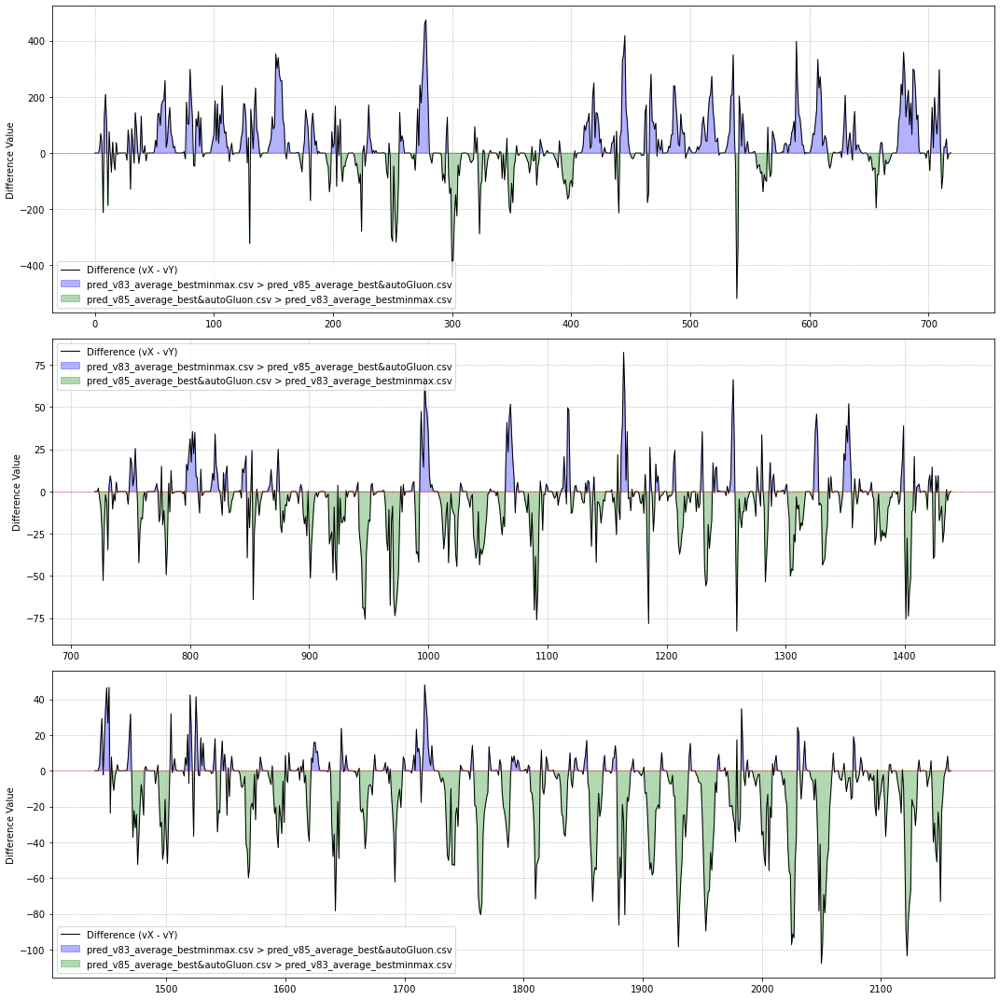

In [ ]:
current_best = ".csv" #add current best predictions
eval = ".csv" #add predictions to evaluate against best


df1 = pd.read_csv(current_best)
df2 = pd.read_csv(eval)

split_index = len(df1) // 3


df1_A = df1.iloc[:split_index]
df1_B = df1.iloc[split_index:2*split_index]
df1_C = df1.iloc[2*split_index:]

df2_A = df2.iloc[:split_index]
df2_B = df2.iloc[split_index:2*split_index]
df2_C = df2.iloc[2*split_index:]

def plot_difference(df1, df2):
    """Plot the difference between two dataframes' predictions."""
    diff = df1['prediction'] - df2['prediction']
    
    plt.plot(df1['id'], diff, label="Difference (vX - vY)", color="black", linewidth=1)
    
    # Highlight areas where Version X is greater than Version Y
    plt.fill_between(df1['id'], diff, where=(diff > 0), color='blue', alpha=0.3, label=f"{current_best} > {eval}")
    
    # Highlight areas where Version Y is greater than Version X
    plt.fill_between(df1['id'], diff, where=(diff < 0), color='green', alpha=0.3, label=f"{eval} > {current_best}")
    
    plt.axhline(0, color='red', linestyle="--", linewidth=0.5)
    plt.ylabel("Difference Value")
    plt.legend()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)


# Set up the plots
fig, ax = plt.subplots(3, 1, figsize=(15, 15))

plt.sca(ax[0])
plot_difference(df1_A, df2_A)

plt.sca(ax[1])
plot_difference(df1_B, df2_B)

plt.sca(ax[2])
plot_difference(df1_C, df2_C)

plt.tight_layout()
plt.show()

## Model Interpretation - Feature Importance

We plot the feature importance for the CatBoost model and the AutoGluon model to verify that it weighs features we also deem important. 

### CatBoost

In [57]:
def plot_combined_feature_importances(models, model_names, n_features_to_plot=10):
    all_feature_importances = []
    
    # Assuming all models have the same features in the same order
    feature_names = models[0].feature_names_

    # Gather feature importances for each model
    for model in models:
        feature_importances = model.get_feature_importance(
            data=None,
            reference_data=None,
            prettified=False,
            thread_count=-1,
            verbose=False
        )
        all_feature_importances.append(feature_importances)

    # Create DataFrame
    feature_importances_df = pd.DataFrame(all_feature_importances, columns=feature_names, index=model_names).transpose()

    # Sort the DataFrame by the average importance across models and take top N for plotting
    feature_importances_df['Average'] = feature_importances_df.mean(axis=1)
    sorted_feature_importances_df = feature_importances_df.sort_values(by='Average', ascending=False).head(n_features_to_plot)

    # Drop the average as we no longer need it
    sorted_feature_importances_df = sorted_feature_importances_df.drop('Average', axis=1)
    
    # Plotting
    plt.figure(figsize=(12, 8))

    # Create the bar positions
    total_width = 0.8
    n_models = len(models)
    individual_width = total_width / n_models
    bar_positions = np.arange(n_features_to_plot)

    for i, model_name in enumerate(model_names):
        plt.barh(bar_positions + i * individual_width, sorted_feature_importances_df[model_name], height=individual_width, label=model_name)

    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Top {n_features_to_plot} Feature Importances Across Models')
    plt.yticks(bar_positions + individual_width * (n_models - 1) / 2, sorted_feature_importances_df.index)
    plt.gca().invert_yaxis()  # To display the highest importance at the top
    plt.legend()
    plt.show()


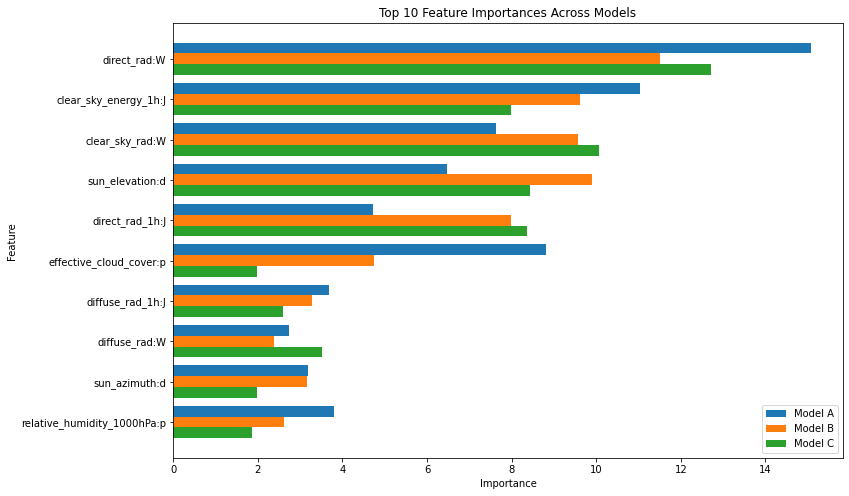

In [58]:
# Catboost
models = [model_a, model_b, model_c]
model_names = ['Model A', 'Model B', 'Model C']
plot_combined_feature_importances(models, model_names)

### AutoGluon

In [59]:
predictor_a.feature_importance(X_val_a)

These features in provided data are not utilized by the predictor and will be ignored: ['snow_drift:idx', 'location']
Computing feature importance via permutation shuffling for 47 features using 5000 rows with 5 shuffle sets...
	628.58s	= Expected runtime (125.72s per shuffle set)
	935.47s	= Actual runtime (Completed 5 of 5 shuffle sets)


,importance,stddev,p_value,n,p99_high,p99_low
direct_rad:W,178.559013,6.793690,2.509801e-07,5,192.547314,164.570711
clear_sky_rad:W,112.678125,2.021998,1.243824e-08,5,116.841447,108.514804
diffuse_rad:W,101.986229,3.089877,1.009831e-07,5,108.348330,95.624129
clear_sky_energy_1h:J,68.660783,1.546655,3.087637e-08,5,71.845367,65.476199
direct_rad_1h:J,64.057486,1.645501,5.220502e-08,5,67.445595,60.669377
sun_elevation:d,43.438606,0.894261,2.154218e-08,5,45.279902,41.597310
hour_cosine,32.659881,1.572582,6.430350e-07,5,35.897849,29.421913
hour_sinus,32.036084,0.950763,9.298269e-08,5,33.993717,30.078450
diffuse_rad_1h:J,24.365570,0.567790,3.535989e-08,5,25.534657,23.196483
effective_cloud_cover:p,22.679920,1.277563,1.203120e-06,5,25.310440,20.049401


In [60]:
predictor_b.feature_importance(X_val_b)

These features in provided data are not utilized by the predictor and will be ignored: ['location']
Computing feature importance via permutation shuffling for 48 features using 5000 rows with 5 shuffle sets...
	816.62s	= Expected runtime (163.32s per shuffle set)
	666.57s	= Actual runtime (Completed 5 of 5 shuffle sets)


,importance,stddev,p_value,n,p99_high,p99_low
clear_sky_rad:W,2.823467e+01,3.473315e-01,2.747511e-09,5,2.894983e+01,2.751951e+01
sun_elevation:d,2.303884e+01,3.465269e-01,6.139822e-09,5,2.375234e+01,2.232533e+01
clear_sky_energy_1h:J,1.868808e+01,2.911380e-01,7.066071e-09,5,1.928753e+01,1.808862e+01
direct_rad:W,1.631298e+01,3.365754e-01,2.173357e-08,5,1.700599e+01,1.561996e+01
diffuse_rad:W,1.319537e+01,1.614370e-01,2.687947e-09,5,1.352777e+01,1.286297e+01
direct_rad_1h:J,1.009402e+01,1.272253e-01,3.027801e-09,5,1.035598e+01,9.832059e+00
diffuse_rad_1h:J,6.331591e+00,2.434501e-01,2.617665e-07,5,6.832858e+00,5.830324e+00
hour_sinus,4.881844e+00,2.846805e-01,1.381369e-06,5,5.468005e+00,4.295683e+00
month_cosine,3.498907e+00,1.434983e-01,3.387393e-07,5,3.794372e+00,3.203442e+00
effective_cloud_cover:p,3.451880e+00,1.445738e-01,3.683846e-07,5,3.749560e+00,3.154201e+00


In [61]:
predictor_c.feature_importance(X_val_c)

These features in provided data are not utilized by the predictor and will be ignored: ['snow_drift:idx', 'location']
Computing feature importance via permutation shuffling for 47 features using 4453 rows with 5 shuffle sets...
	281.48s	= Expected runtime (56.3s per shuffle set)
	231.05s	= Actual runtime (Completed 5 of 5 shuffle sets)


,importance,stddev,p_value,n,p99_high,p99_low
clear_sky_rad:W,26.676175,0.481768,1.275995e-08,5,27.668142,25.684209
clear_sky_energy_1h:J,20.080670,0.356752,1.194951e-08,5,20.815227,19.346113
direct_rad:W,12.666042,0.261663,2.184446e-08,5,13.204810,12.127273
sun_elevation:d,8.558859,0.200901,3.640217e-08,5,8.972517,8.145201
direct_rad_1h:J,8.327211,0.155400,1.454728e-08,5,8.647181,8.007241
diffuse_rad:W,8.071502,0.362363,4.861517e-07,5,8.817612,7.325392
diffuse_rad_1h:J,3.318592,0.062202,1.480418e-08,5,3.446667,3.190517
effective_cloud_cover:p,2.701534,0.221102,5.336276e-06,5,3.156786,2.246283
t_1000hPa:K,2.311406,0.149590,2.093439e-06,5,2.619413,2.003399
estimated,2.227778,0.059694,6.180152e-08,5,2.350688,2.104867


## Evaluation Metric

In [62]:
print(f"MAE for A: {model_a.get_best_score()['validation']['MAE']}")
print(f"MAE for B: {model_b.get_best_score()['validation']['MAE']}")
print(f"MAE for C: {model_c.get_best_score()['validation']['MAE']}")

MAE for A: 167.175328081851
MAE for B: 24.012107975927687
MAE for C: 22.249160534376543
